In [1]:
%load_ext autoreload

In [15]:
%autoreload 2
import cv2
from farneback_regularized import *
from reconstruct import get_from_mat, correct_image, iradon_centered, find_visual_best
from time import time

In [4]:
angles = get_from_mat("../data/2018_11005553_syn033_68R_Mg10Gd_12w/angles.mat")
shifts = 1.5 * get_from_mat("../data/2018_11005553_syn033_68R_Mg10Gd_12w/offset_shift.mat")

In [5]:
from PIL import Image
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

def get_tiffs_from_folder(path='../data/2018_11005553_syn033_68R_Mg10Gd_12w/sino_rawBin2'):
    tiffs = []
    for tiff_file in tqdm(sorted([os.path.join(path, file) for file in os.listdir(path)])):
        tiffs.append(correct_image(np.array(Image.open(tiff_file)), shifts))
    return np.array(tiffs)

In [6]:
tiffs = get_tiffs_from_folder()

100%|██████████| 476/476 [09:27<00:00,  1.19s/it]


In [7]:
tiffs.shape

(476, 3001, 2460)

## Run some experiments

In [9]:
converted_angles = angles.squeeze() * 180 / np.pi

In [10]:
# align:

i = 0
left = tiffs[:,i, :]
aligned_id = np.argmin(np.abs(converted_angles - 180 - converted_angles[i]))
right = tiffs[:,aligned_id, ::-1]

In [11]:
def draw_flow(img, flow, step=8):
    h, w = img.shape[:2]
    y, x = np.mgrid[step/2:h:step, step/2:w:step].reshape(2,-1).astype(int)
    fx, fy = flow[y,x].T
    lines = np.vstack([x, y, x+fy, y+fx]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = img.copy()
#     vis = cv2.polylines(vis, lines, 0, (0, 255, 0))
    for (x1, y1), (x2, y2) in lines:
#         print(x1, y1, x2, y2)
        vis = cv2.arrowedLine(vis, (x1, y1), (x2, y2), np.random.randint(0,255,(1,3))[0].tolist(), 2)
#         vis = cv2.circle(vis, (x1, y1), 1, (0, 255, 0), -1)
    return vis

In [12]:
def get_results(flow):
    plt.figure(figsize=(60, 20))
    plt.imshow(draw_flow(left, flow, step=10))
    plt.show()
    predictions = -flow[..., 1].flatten() / 2
    filtered_mask = np.logical_and(predictions > np.quantile(predictions, 0.05), predictions < np.quantile(predictions, 0.95))
    filtered = predictions[filtered_mask]
    print('mean:', np.mean(filtered), 'standart error:', np.std(filtered) / np.sqrt(len(filtered)))
    plt.hist(filtered, bins=40)
    plt.title('predictions histogram')
    plt.show()
    print('mean zero-axis axis:', flow[..., 0].mean(), 'std:', flow[..., 0].std())
    plt.hist(flow[..., 0].flatten(), bins=40)
    plt.title('zero-axis histogram')
    plt.show()
    return predictions

------------ sigma: 5.0 ----- l_coef: 0.0 -------------
18.168729305267334 seconds spent


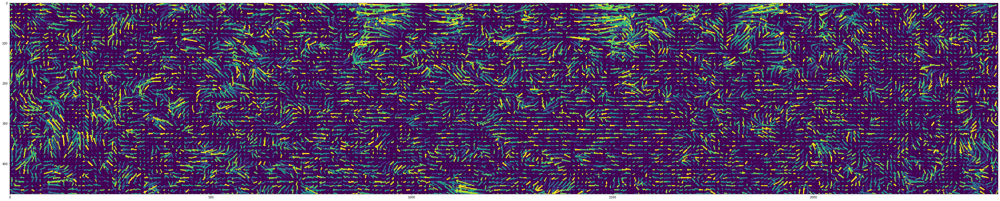

mean: 1.8926268486577098 standart error: 0.0030731647410722545


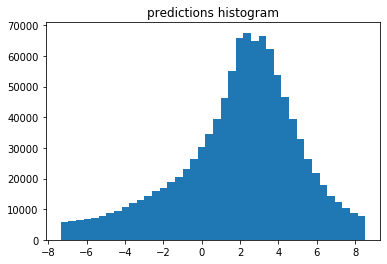

mean zero-axis axis: -0.35439444856694363 std: 6.156903864932906


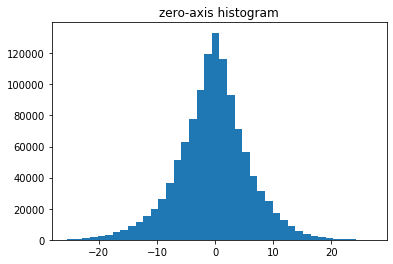

------------ sigma: 5.0 ----- l_coef: 0.5 -------------
17.78953194618225 seconds spent


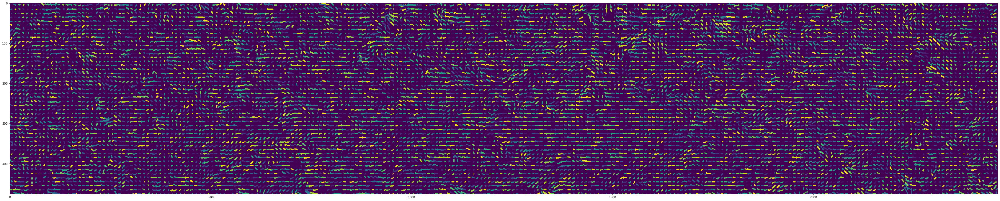

mean: 2.3000875258076494 standart error: 0.0010856951401866345


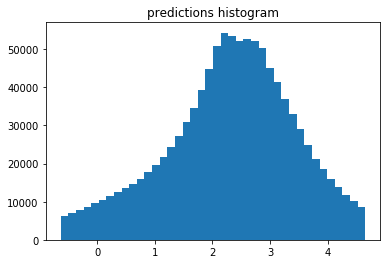

mean zero-axis axis: -0.018857602383603466 std: 2.221358278899194


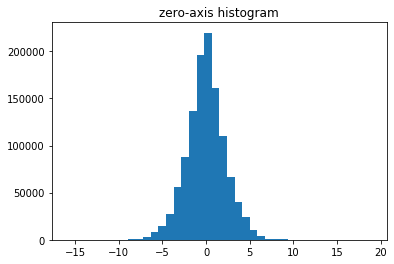

------------ sigma: 5.0 ----- l_coef: 0.9 -------------
17.893131256103516 seconds spent


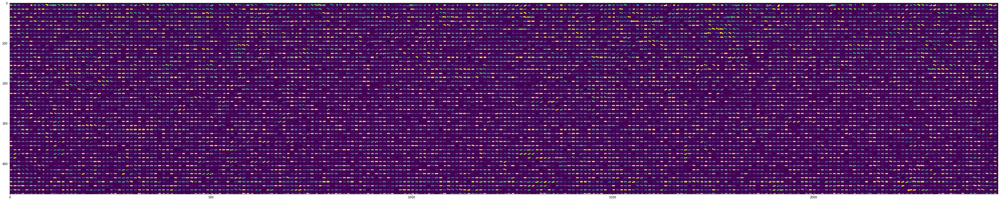

mean: 2.57245859842402 standart error: 0.00019118590462433065


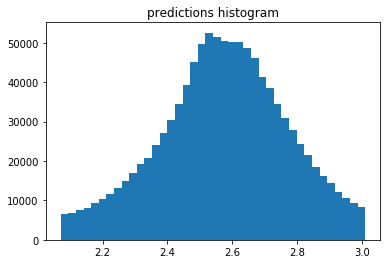

mean zero-axis axis: 0.004678550160731997 std: 0.4171104028913259


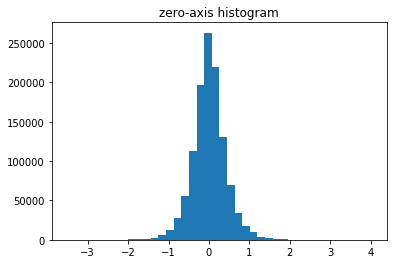

------------ sigma: 5.0 ----- l_coef: 0.95 -------------
18.000671863555908 seconds spent


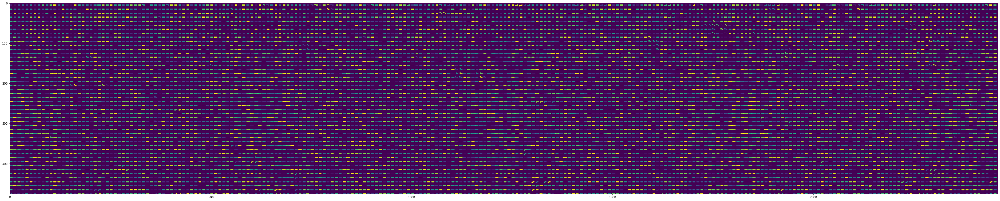

mean: 2.6304850020462713 standart error: 9.42552485412573e-05


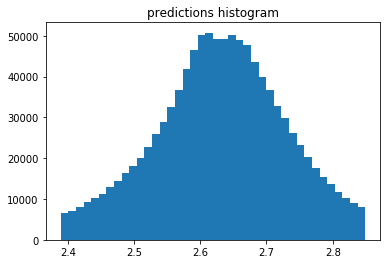

mean zero-axis axis: 0.002450229885814165 std: 0.2087977189243095


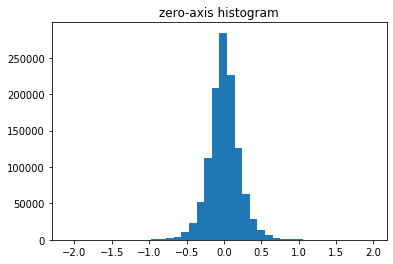

------------ sigma: 5.0 ----- l_coef: 0.99 -------------
17.065932512283325 seconds spent


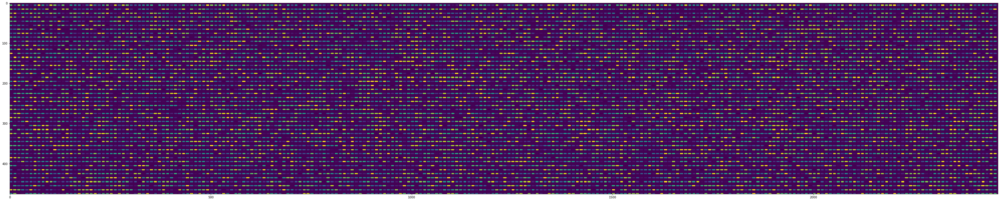

mean: 2.7504023623191736 standart error: 1.8194730592864885e-05


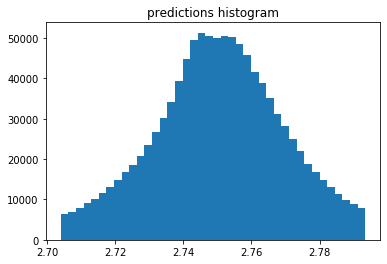

mean zero-axis axis: 0.0004837841129248854 std: 0.04173507166749759


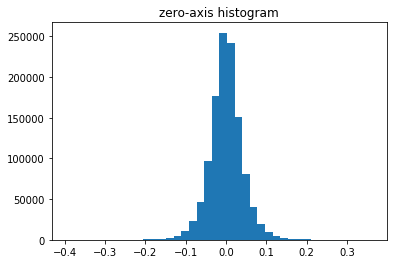

------------ sigma: 50.0 ----- l_coef: 0.0 -------------
101.42486119270325 seconds spent


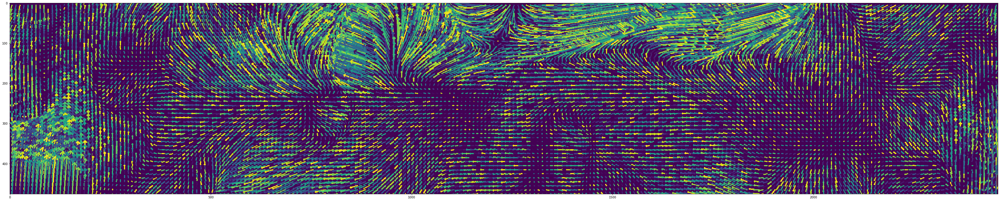

mean: 0.7503790083313275 standart error: 0.0064784596616855265


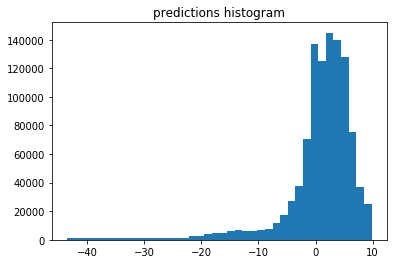

mean zero-axis axis: -7.015547940800673 std: 19.688343185277052


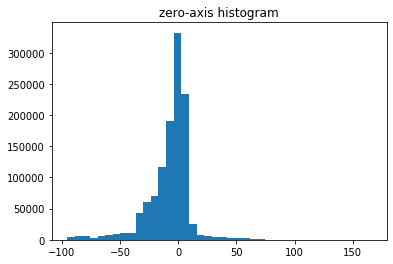

------------ sigma: 50.0 ----- l_coef: 0.5 -------------
73.32218170166016 seconds spent


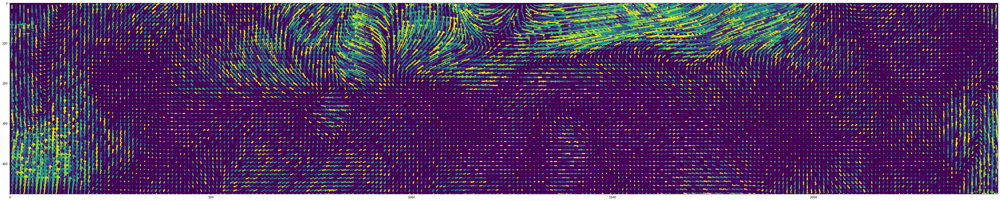

mean: -0.3449140882364577 standart error: 0.0027851191470204713


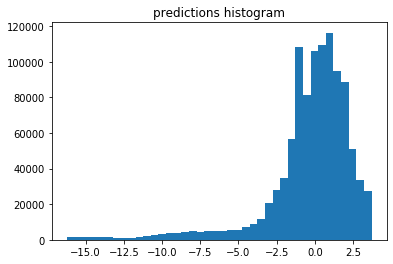

mean zero-axis axis: -3.5337547184687907 std: 10.578586221432646


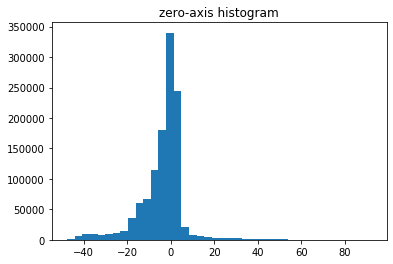

------------ sigma: 50.0 ----- l_coef: 0.9 -------------
72.1766152381897 seconds spent


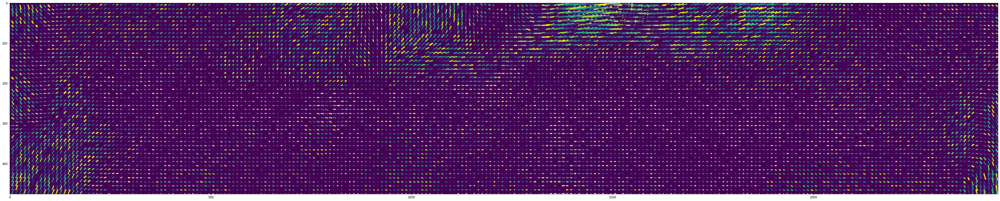

mean: -1.6598563842838256 standart error: 0.0005447834951450016


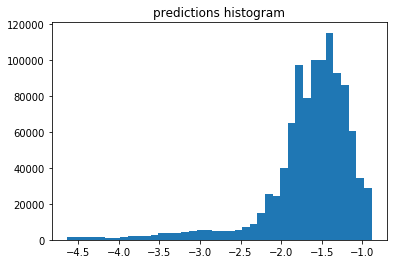

mean zero-axis axis: -0.7293514046957249 std: 2.300334430749348


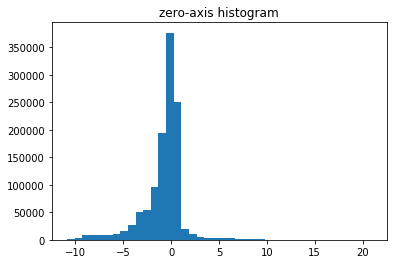

------------ sigma: 50.0 ----- l_coef: 0.95 -------------
72.67442846298218 seconds spent


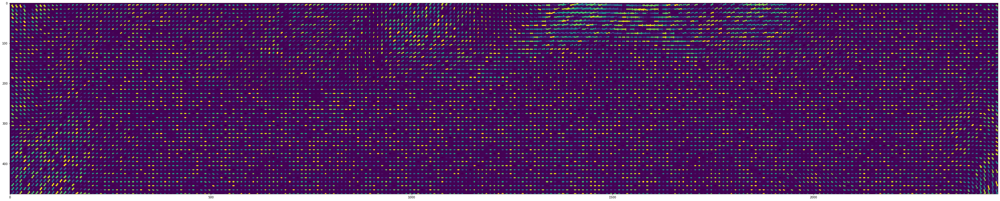

mean: -1.5638866990185658 standart error: 0.0002718847478548784


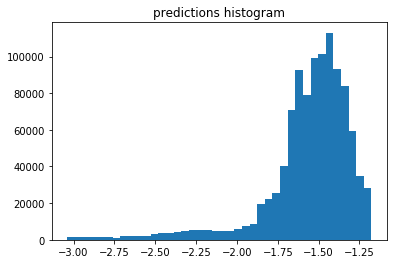

mean zero-axis axis: -0.36355758569047925 std: 1.173903937868399


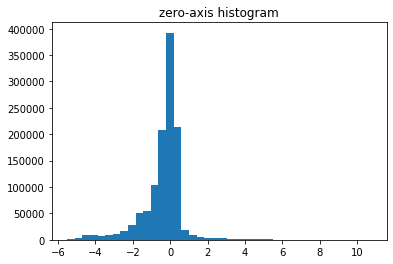

------------ sigma: 50.0 ----- l_coef: 0.99 -------------
72.39759254455566 seconds spent


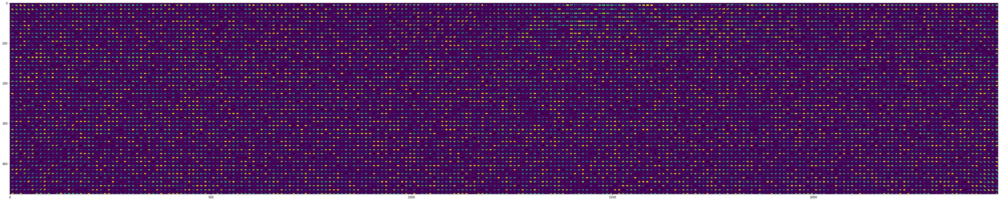

mean: -1.5230171882716708 standart error: 5.43725883636136e-05


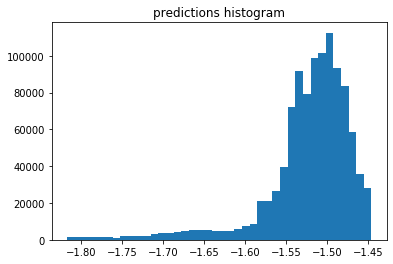

mean zero-axis axis: -0.07266164397187824 std: 0.23680148813293633


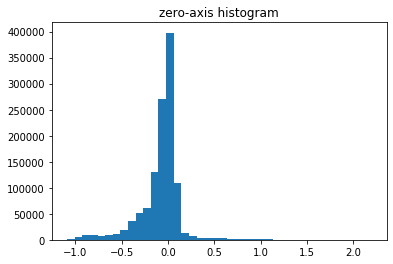

------------ sigma: 250.0 ----- l_coef: 0.0 -------------
310.93295884132385 seconds spent


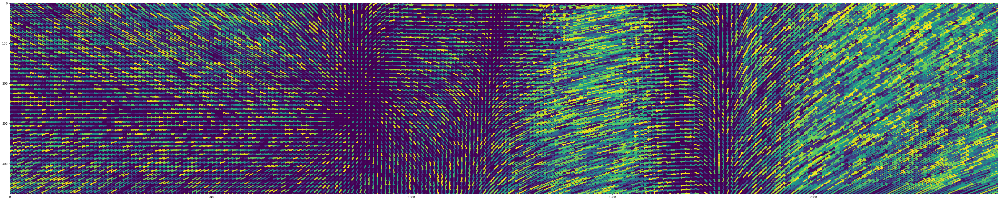

mean: -1.03014889938293 standart error: 0.012384083934330917


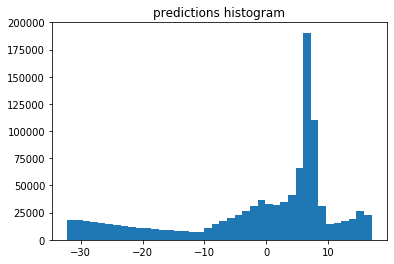

mean zero-axis axis: -6.854012395371786 std: 14.513589308263315


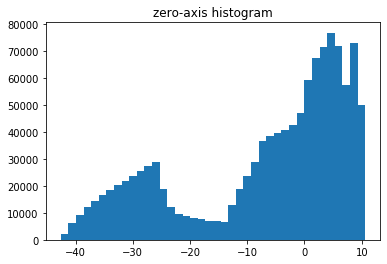

------------ sigma: 250.0 ----- l_coef: 0.5 -------------
301.0911042690277 seconds spent


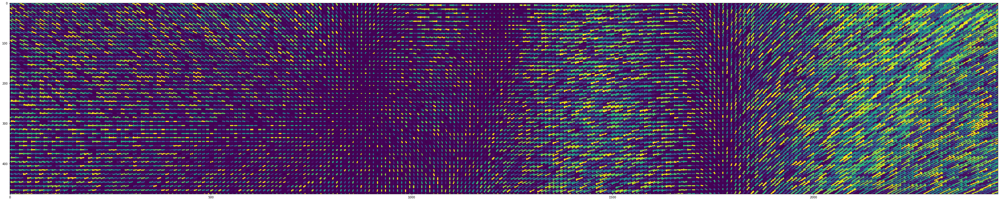

mean: -0.0019608818637845615 standart error: 0.0057900232757268945


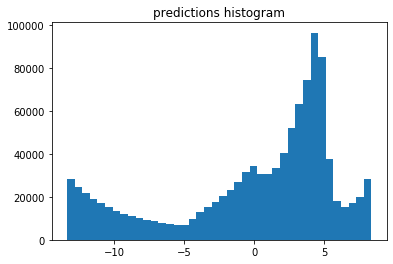

mean zero-axis axis: -3.3986092846933547 std: 6.647837744648099


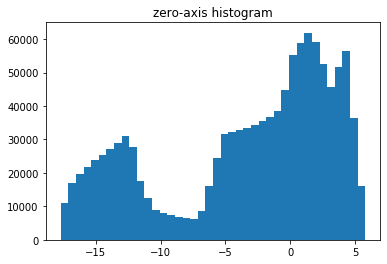

------------ sigma: 250.0 ----- l_coef: 0.9 -------------
300.43395376205444 seconds spent


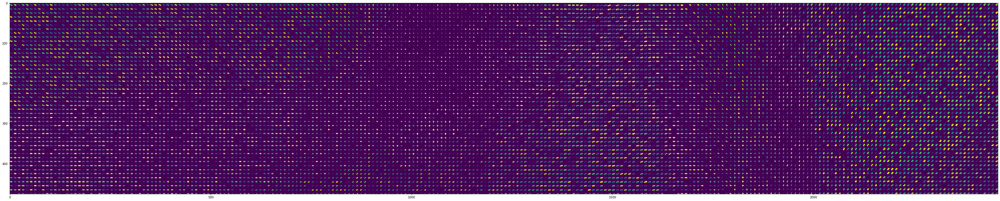

mean: 0.8950093036935878 standart error: 0.0011228980075601955


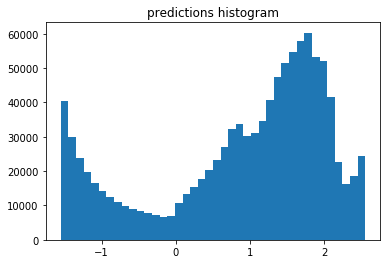

mean zero-axis axis: -0.6909032882516073 std: 1.2753085954163235


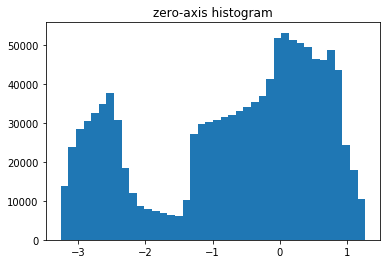

------------ sigma: 250.0 ----- l_coef: 0.95 -------------
300.88512563705444 seconds spent


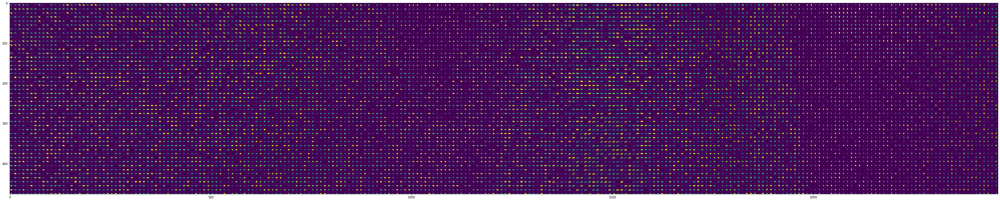

mean: 1.0100432603938099 standart error: 0.0005594864283875095


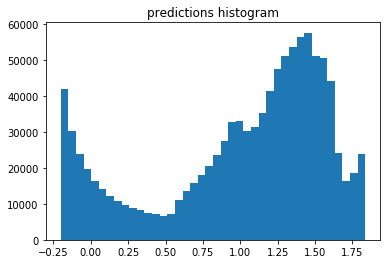

mean zero-axis axis: -0.34770896560818126 std: 0.6352281133527112


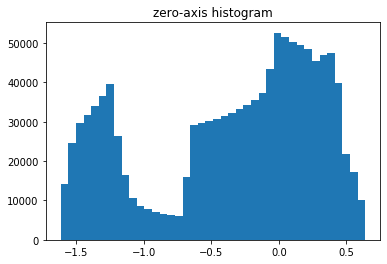

------------ sigma: 250.0 ----- l_coef: 0.99 -------------
301.572585105896 seconds spent


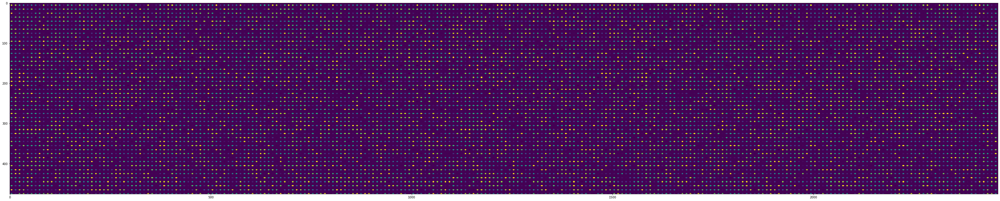

mean: 1.041552162507173 standart error: 0.00011198641237113834


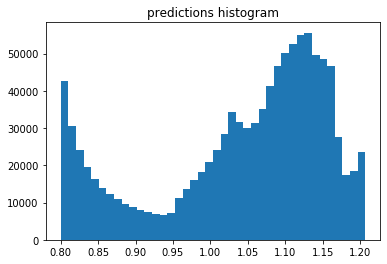

mean zero-axis axis: -0.06983284352807763 std: 0.12683530656535366


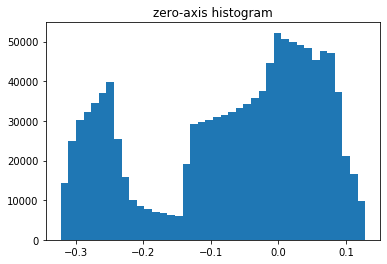

In [16]:
for sigma in [5., 50., 250.]:
    for l_coef in [0., 0.5, 0.9, 0.95, 0.99]:
        start_time = time()
        print('------------ sigma:', sigma, '----- l_coef:', l_coef, '-------------')
        flow = infer(left, right, opts=dict(
            sigma=sigma,
            sigma_flow=sigma,
            num_iter=3,
            model='constant',
            mu=0,
            l_coef=l_coef
        ))
        print(time() - start_time, 'seconds spent')
        _ = get_results(flow)

### Set mu to None:

------------ sigma: 5.0 ----- l_coef: 0.0 -------------
18.38015341758728 seconds spent


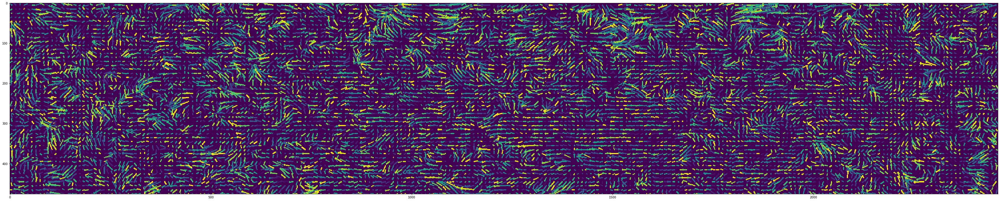

mean: 2.035921000642735 standart error: 0.0026976105741749945


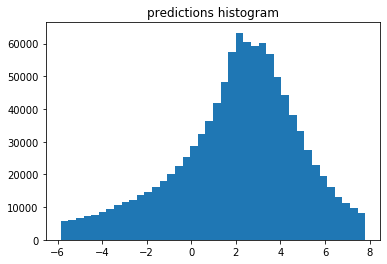

mean zero-axis axis: -0.17806063113702222 std: 5.759884756572206


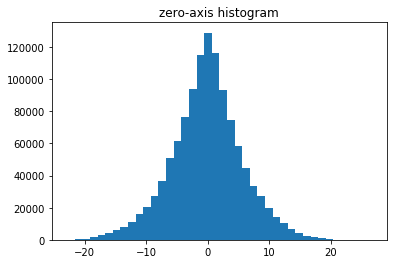

------------ sigma: 5.0 ----- l_coef: 0.5 -------------
18.021442651748657 seconds spent


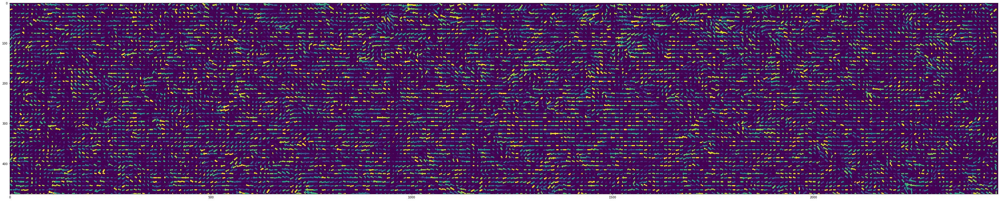

mean: 2.3787492866530284 standart error: 0.0010258567581112553


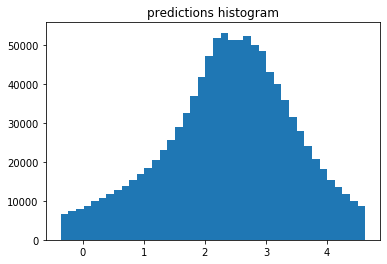

mean zero-axis axis: 0.0016575084062719655 std: 2.185878365121277


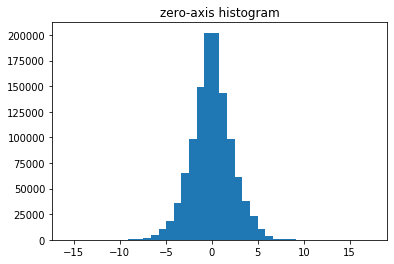

------------ sigma: 5.0 ----- l_coef: 0.9 -------------
18.183139085769653 seconds spent


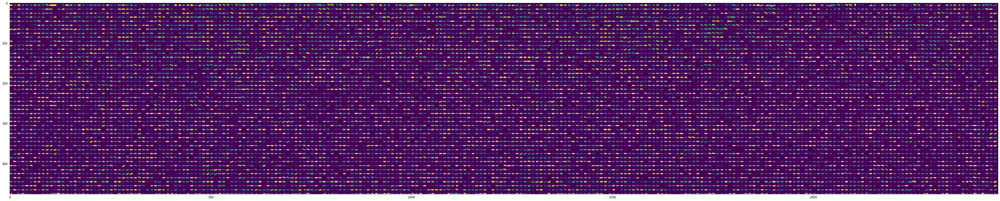

mean: 2.595213074656809 standart error: 0.00018255522072565159


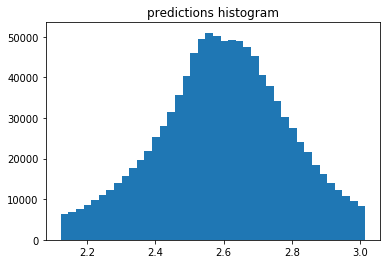

mean zero-axis axis: 0.004564134703055124 std: 0.41065021707943106


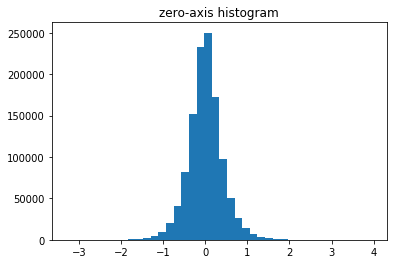

------------ sigma: 5.0 ----- l_coef: 0.95 -------------
18.3884015083313 seconds spent


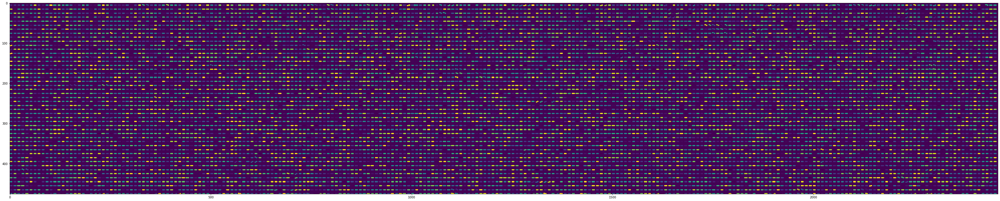

mean: 2.647805352649854 standart error: 9.017285461106345e-05


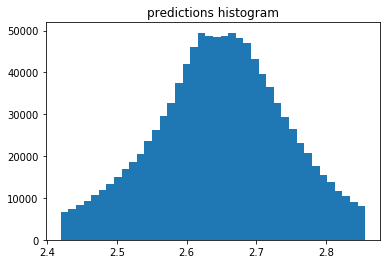

mean zero-axis axis: 0.0023472679272048 std: 0.20523458935800326


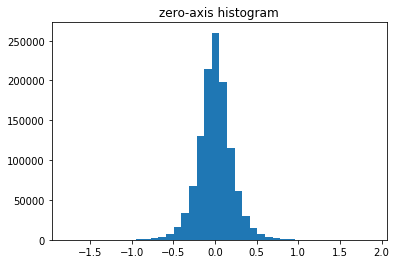

------------ sigma: 5.0 ----- l_coef: 0.99 -------------
18.375128746032715 seconds spent


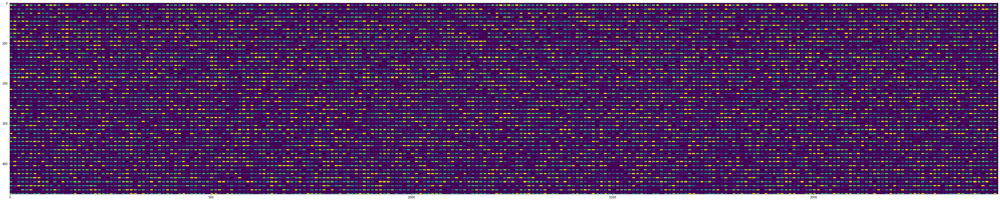

mean: 2.752250874026537 standart error: 1.74145082504382e-05


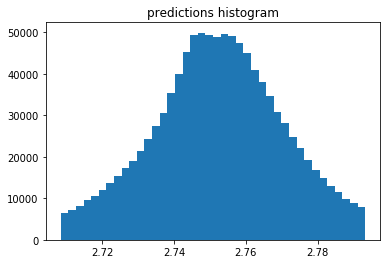

mean zero-axis axis: 0.000466250397806469 std: 0.04104503434265575


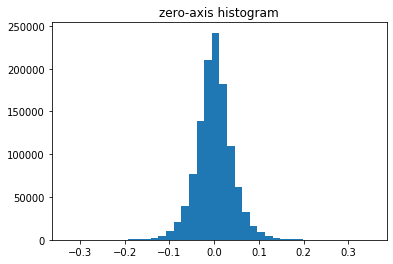

------------ sigma: 50.0 ----- l_coef: 0.0 -------------
72.51187252998352 seconds spent


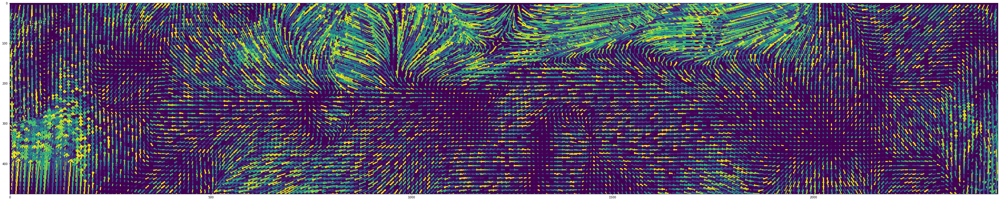

mean: 0.7918238460773203 standart error: 0.006349925052124661


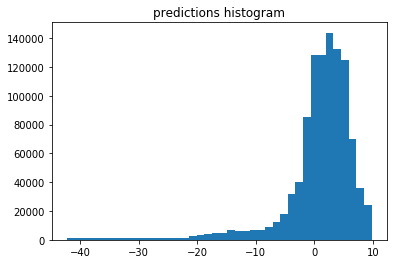

mean zero-axis axis: -7.042816712735371 std: 19.324518498693806


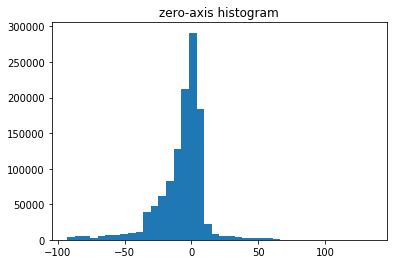

------------ sigma: 50.0 ----- l_coef: 0.5 -------------
73.34628534317017 seconds spent


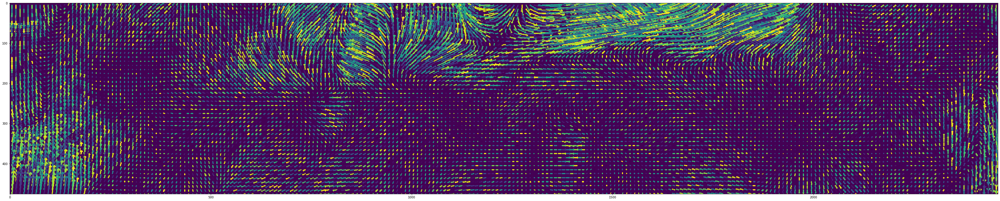

mean: -0.3115855952986444 standart error: 0.0027582978698593302


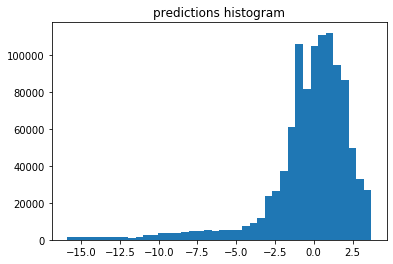

mean zero-axis axis: -3.5495705651481333 std: 10.357953222706035


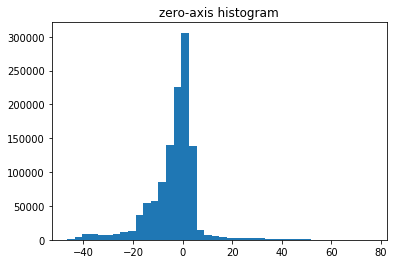

------------ sigma: 50.0 ----- l_coef: 0.9 -------------
72.5650007724762 seconds spent


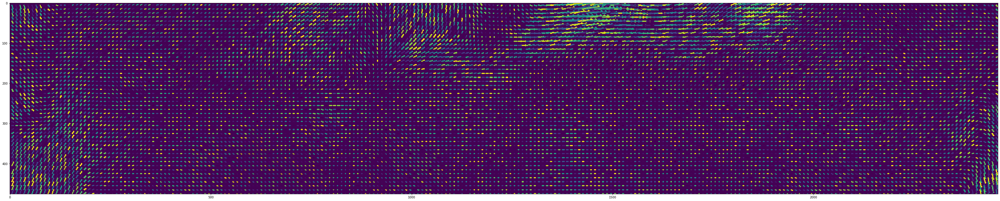

mean: -1.5728481681920903 standart error: 0.0005400459101686248


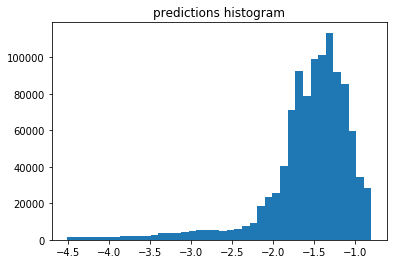

mean zero-axis axis: -0.7315262309187128 std: 2.253990552077487


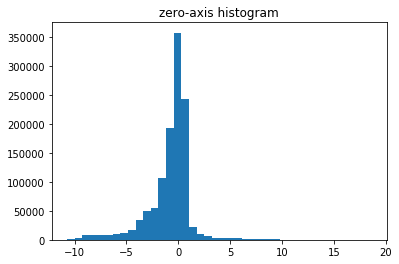

------------ sigma: 50.0 ----- l_coef: 0.95 -------------
73.46129298210144 seconds spent


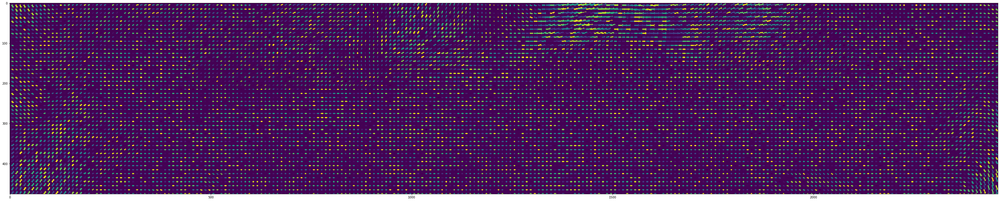

mean: -1.4888165915509861 standart error: 0.0002695550086417792


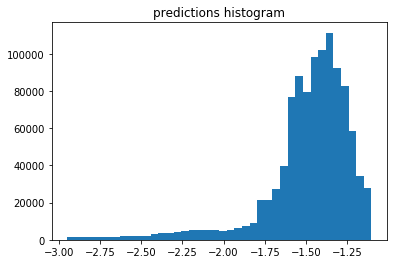

mean zero-axis axis: -0.36471891338712936 std: 1.1510656746698398


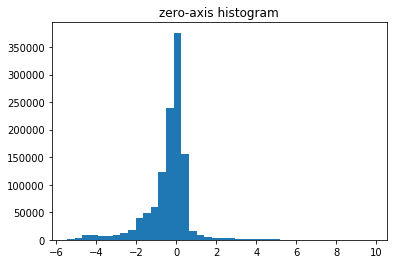

------------ sigma: 50.0 ----- l_coef: 0.99 -------------
73.52393317222595 seconds spent


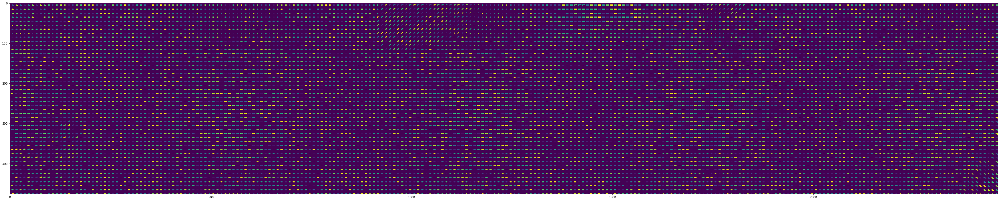

mean: -1.4528065382419137 standart error: 5.38803746854227e-05


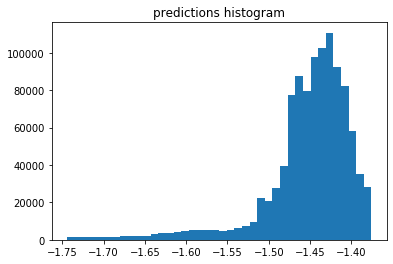

mean zero-axis axis: -0.0726344708615369 std: 0.2326106543297638


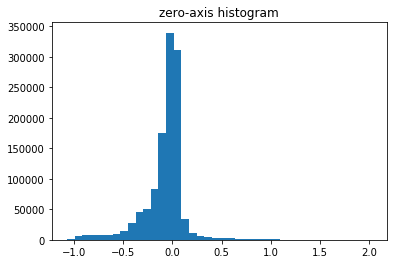

------------ sigma: 250.0 ----- l_coef: 0.0 -------------
310.5858578681946 seconds spent


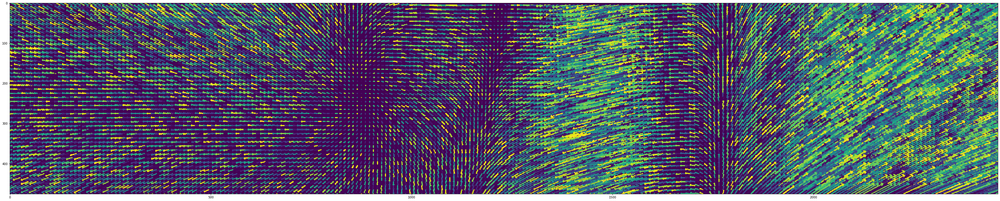

mean: -1.029868264877924 standart error: 0.012383546403109947


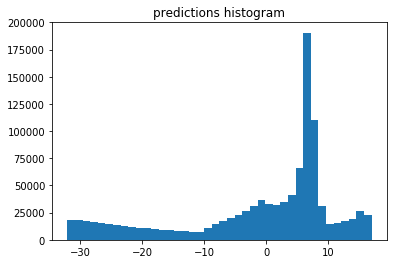

mean zero-axis axis: -6.853677708303622 std: 14.512749395331152


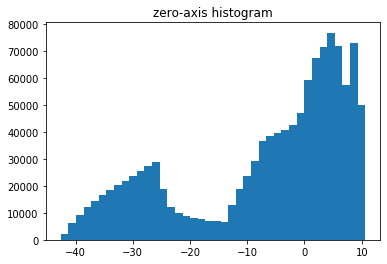

------------ sigma: 250.0 ----- l_coef: 0.5 -------------
305.73906922340393 seconds spent


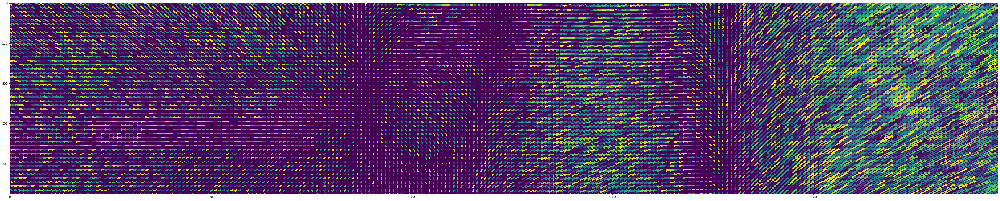

mean: -0.0018087506742121998 standart error: 0.005789796708662193


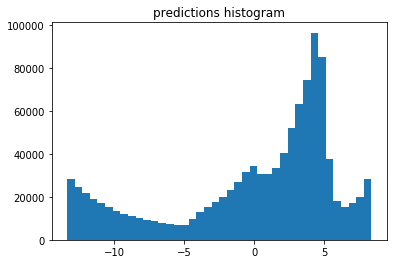

mean zero-axis axis: -3.3984627460121715 std: 6.647539377939022


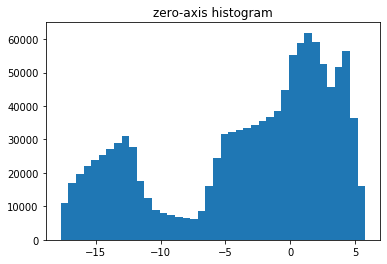

------------ sigma: 250.0 ----- l_coef: 0.9 -------------
302.3170585632324 seconds spent


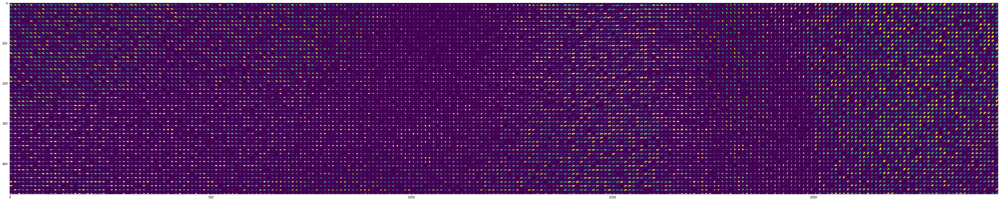

mean: 0.8951357596735313 standart error: 0.0011228543863881627


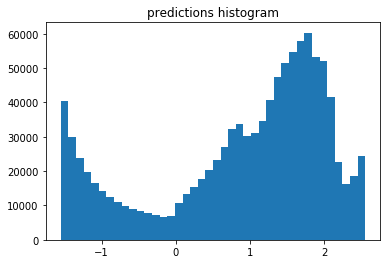

mean zero-axis axis: -0.6908758659253543 std: 1.2752552706402898


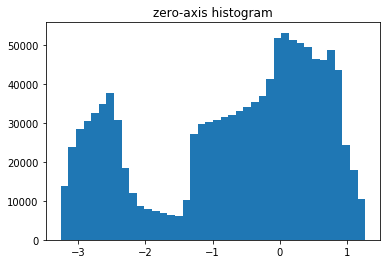

------------ sigma: 250.0 ----- l_coef: 0.95 -------------
302.65150356292725 seconds spent


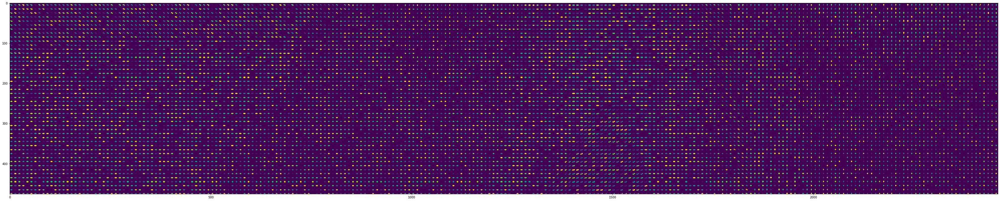

mean: 1.0101119213661731 standart error: 0.0005594642263010765


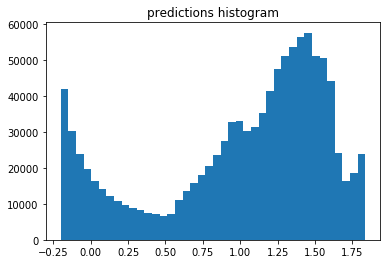

mean zero-axis axis: -0.347694240229923 std: 0.6352030391918477


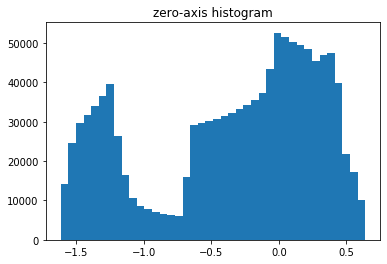

------------ sigma: 250.0 ----- l_coef: 0.99 -------------
330.4653584957123 seconds spent


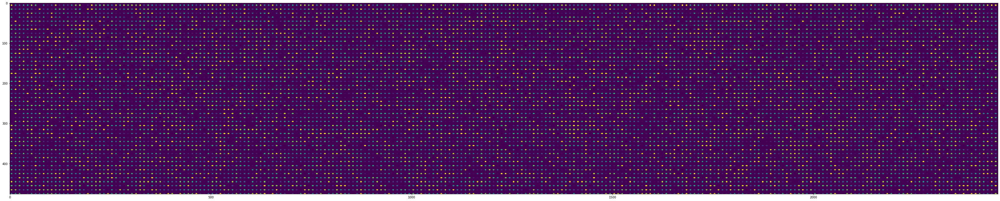

mean: 1.0417380749384846 standart error: 0.00011198250632224833


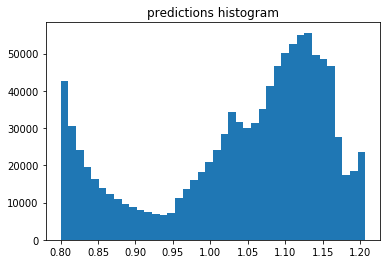

mean zero-axis axis: -0.06983066686069517 std: 0.1268301812430576


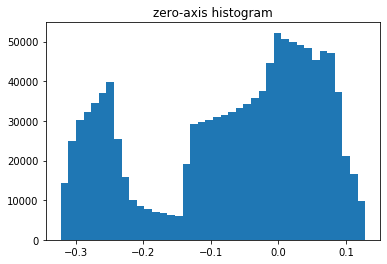

In [17]:
for sigma in [5., 50., 250.]:
    for l_coef in [0., 0.5, 0.9, 0.95, 0.99]:
        start_time = time()
        print('------------ sigma:', sigma, '----- l_coef:', l_coef, '-------------')
        flow = infer(left, right, opts=dict(
            sigma=sigma,
            sigma_flow=sigma,
            num_iter=3,
            model='constant',
            mu=None,
            l_coef=l_coef
        ))
        print(time() - start_time, 'seconds spent')
        _ = get_results(flow)

### Set more iters:

------------ sigma: 5.0 ----- l_coef: 0.0 -------------
106.33965849876404 seconds spent


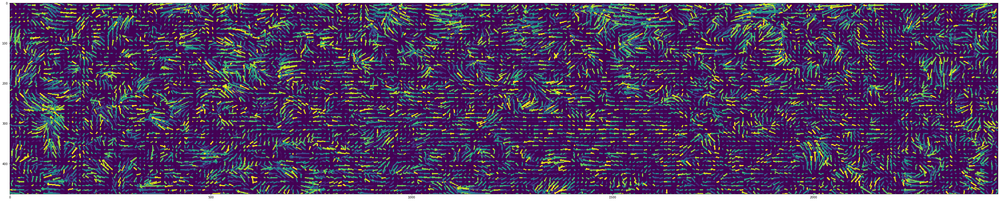

mean: 2.1005269734153615 standart error: 0.0031173344118876956


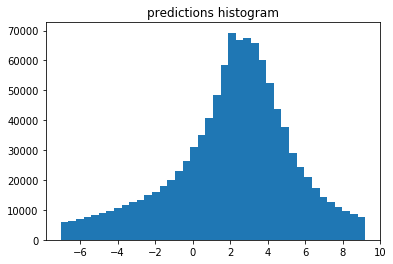

mean zero-axis axis: -0.2334456772783576 std: 6.513696921962677


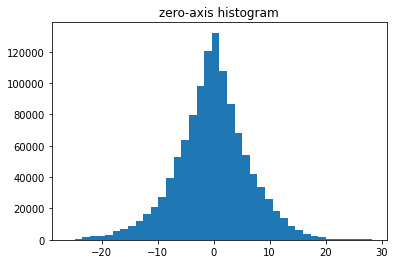

------------ sigma: 5.0 ----- l_coef: 0.5 -------------
106.87212705612183 seconds spent


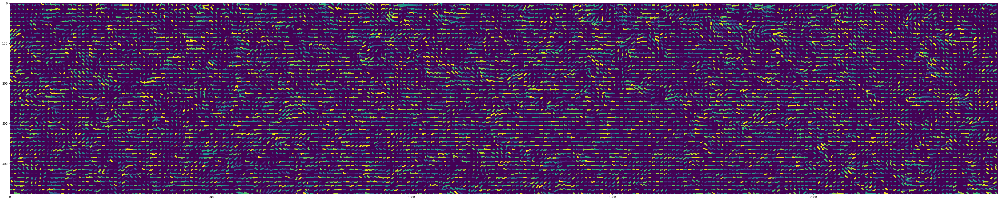

mean: 2.6017988107397954 standart error: 0.001019262706173522


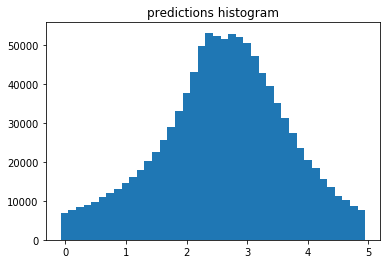

mean zero-axis axis: 0.027741517002770246 std: 2.1910861881904165


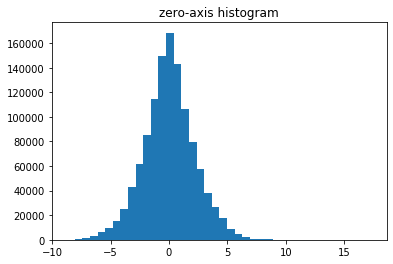

------------ sigma: 5.0 ----- l_coef: 0.9 -------------
90.80339074134827 seconds spent


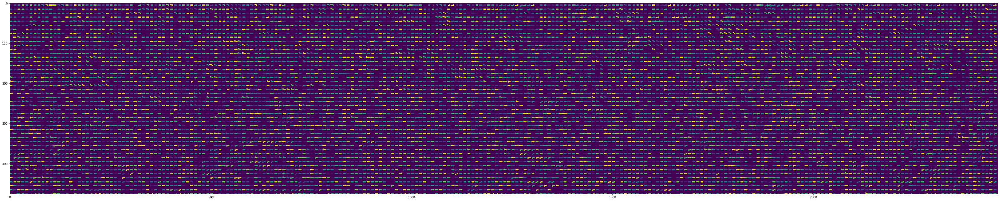

mean: 2.7359551605709043 standart error: 0.00017908392636425787


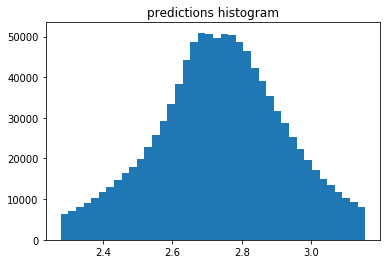

mean zero-axis axis: 0.004349117535919606 std: 0.40984396931010314


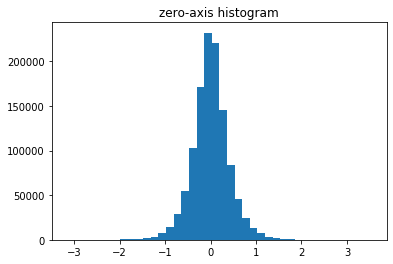

------------ sigma: 5.0 ----- l_coef: 0.95 -------------
47.93901705741882 seconds spent


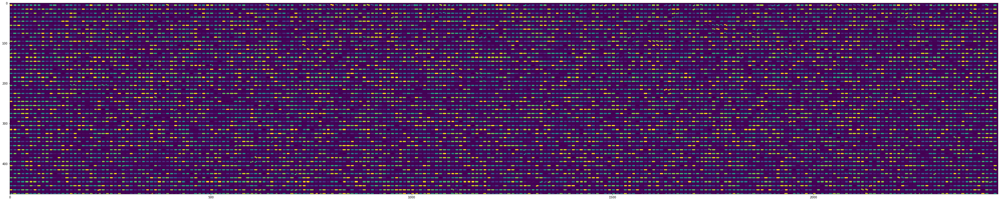

mean: 2.7515200662601593 standart error: 8.744552537537385e-05


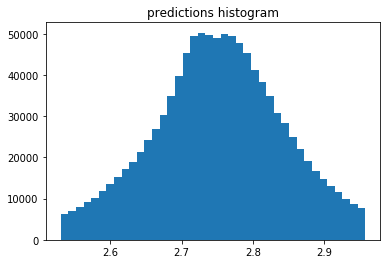

mean zero-axis axis: 0.0023142924940156694 std: 0.20489130609444992


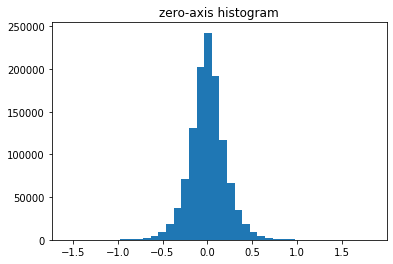

------------ sigma: 5.0 ----- l_coef: 0.99 -------------
48.27339768409729 seconds spent


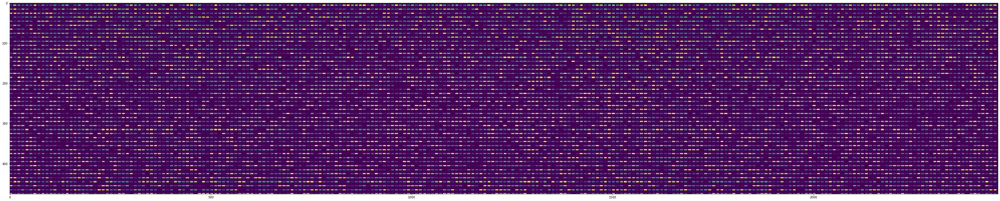

mean: 2.760137557701867 standart error: 1.73848705298158e-05


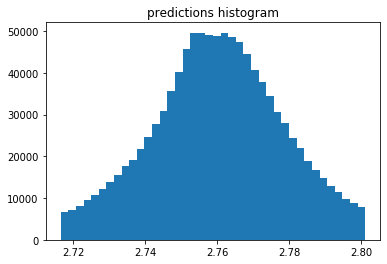

mean zero-axis axis: 0.00047169961315081084 std: 0.04104100162035061


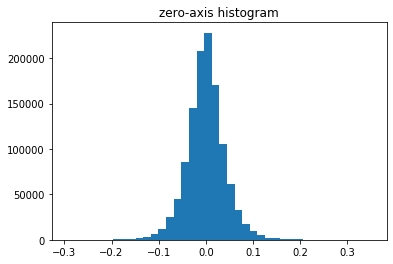

In [18]:
for sigma in [5.]:
    for l_coef in [0., 0.5, 0.9, 0.95, 0.99]:
        start_time = time()
        print('------------ sigma:', sigma, '----- l_coef:', l_coef, '-------------')
        flow = infer(left, right, opts=dict(
            sigma=sigma,
            sigma_flow=sigma,
            num_iter=15,
            model='constant',
            mu=None,
            l_coef=l_coef
        ))
        print(time() - start_time, 'seconds spent')
        _ = get_results(flow)

In [43]:
predictions = -flow[..., 1] / 2

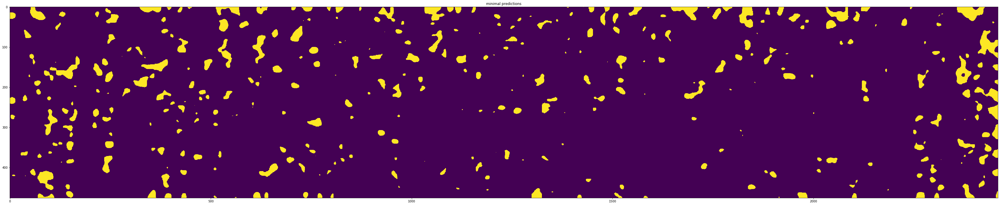

In [59]:
plt.figure(figsize=(60, 20))
plt.imshow((predictions < 2.72) * 255)
plt.title('minimal predictions')
plt.show()

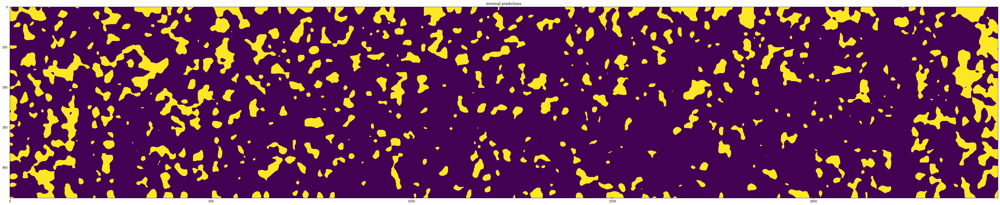

In [60]:
plt.figure(figsize=(60, 20))
plt.imshow((predictions < 2.74) * 255)
plt.title('minimal predictions')
plt.show()

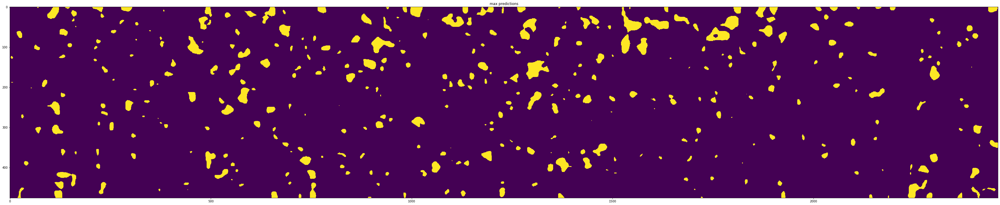

In [61]:
plt.figure(figsize=(60, 20))
plt.imshow((predictions > 2.8) * 255)
plt.title('max predictions')
plt.show()

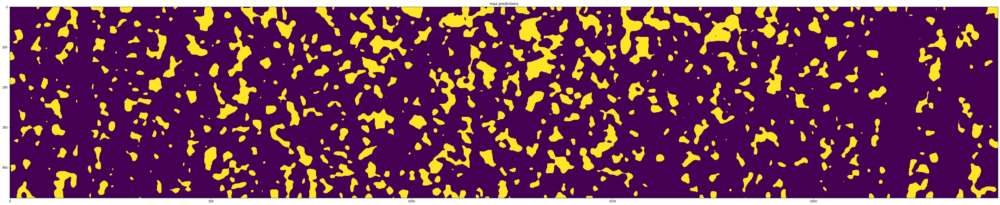

In [62]:
plt.figure(figsize=(60, 20))
plt.imshow((predictions > 2.78) * 255)
plt.title('max predictions')
plt.show()

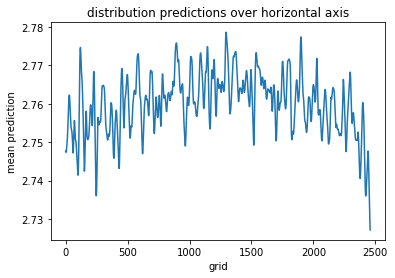

In [64]:
plt.plot(np.arange(predictions.shape[1]), predictions.mean(axis=0))
plt.title('distribution predictions over horizontal axis')
plt.xlabel('grid')
plt.ylabel('mean prediction')
plt.show()